# **Instance Segmentation with YOLO11 Using the Semantic Boundary Dataset**

In this notebook, I perform fine-tuning on the [YOLO11-seg](https://docs.ultralytics.com/tasks/segment/) model by [Ultralytics](https://www.ultralytics.com/), the latest and most advanced model in the YOLO series for real-time instance segmentation. The YOLO11-seg models have been pre-trained on the [COCO](https://docs.ultralytics.com/datasets/detect/coco/#coco-pretrained-models) dataset, which consists of 200,000 images and 80 object categories, providing a strong foundation for general instance segmentation tasks.  

In this case, we specifically fine-tune the `YOLO11l-seg` model, which has 27.6 million parameters and is the second-best Ultralytics model for instance segmentation in terms of accuracy and performance.  

The fine-tuning process is conducted using the [Semantic Boundary Dataset (SBD)](https://github.com/shelhamer/fcn.berkeleyvision.org/blob/master/data/pascal/README.md), a dataset derived from [PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/voc2012/) and specifically designed for segmentation tasks. Unlike PASCAL VOC, which is an older dataset, SBD offers a larger number of images and more detailed annotations for instance segmentation.  

One of the key improvements of SBD over PASCAL VOC is the accuracy of instance annotations. In PASCAL VOC, annotations include a pixel border around each instance, introducing noise and making it less suitable for semantic segmentation, let alone instance segmentation. SBD removes these borders, significantly improving annotation quality.  

The raw SBD dataset consists of **8,498 images** for training and **2,857 images** for validation. Like PASCAL VOC, SBD includes 20 object classes for instance segmentation. 

## **Imports**

In [ ]:
# Installation of the Ultralytics library
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image
from google.colab import drive
from glob import glob
from IPython.display import clear_output, display, Video
import yaml
import cv2
import os

# Necessary in Colab with Ultralytics to prevent path-related encoding errors
import locale
locale.getpreferredencoding = lambda: "UTF-8"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Mount Google Drive in Colab
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


## **Parameters**

In [ ]:
model_name = "yolo11l-seg.pt"
zip_dataset_path = "/content/drive/MyDrive/Datasets/SBD.zip"
dataset_dir = os.path.basename(zip_dataset_path).split(".")[0]
project_dir = "/content/drive/MyDrive/Ultralytics"
project_name = os.path.join(project_dir, "InstanceSegmentation_YOLO11l_SBD")
batch_size = 16
epochs = 25
patience = 5
imgsz = 640

## **Preparing the Dataset for Training**

### **Load the Dataset**

The download, along with all the preprocessing and analysis of the SBD, has been completed in the following notebook: [Preprocessing_SBD](https://github.com/JersonGB22/ImageSegmentation-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_SBD.ipynb).

In [ ]:
!unzip -q $zip_dataset_path

### **Visualization Example**

Next, an example of the training dataset is manually plotted. With Ultralytics, data augmentation, training, and inference are very straightforward processes, so it won't even be necessary to plot the images with their masks, as will be demonstrated later.

In [ ]:
# Extract the class names from the YAML file
with open(os.path.join(dataset_dir, "data.yaml"), "r") as archivo:
    metadata = yaml.safe_load(archivo)

class_names = metadata["names"]
class_colors = metadata["colors"]
print(class_names)

{0: 'aeroplane', 1: 'bicycle', 2: 'bird', 3: 'boat', 4: 'bottle', 5: 'bus', 6: 'car', 7: 'cat', 8: 'chair', 9: 'cow', 10: 'diningtable', 11: 'dog', 12: 'horse', 13: 'motorbike', 14: 'person', 15: 'pottedplant', 16: 'sheep', 17: 'sofa', 18: 'train', 19: 'tvmonitor'}


In [ ]:
image = np.array(Image.open("/content/SBD/train/images/2010_002586.jpg"))

with open("/content/SBD/train/labels/2010_002586.txt", "r") as file:
  labels = [row.split() for row in file.readlines()]

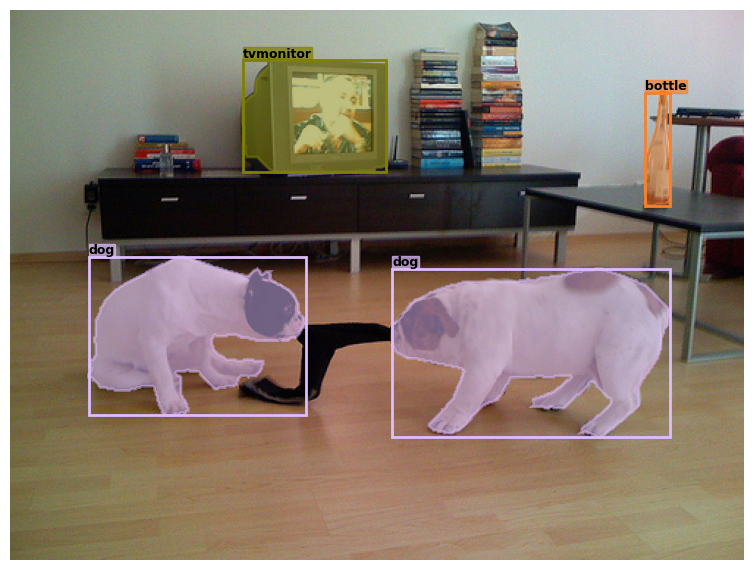

In [ ]:
fig, ax = plt.subplots(1, figsize=(8, 8))
shape = image.shape

ax.imshow(image)
for contour in labels:
  cls = int(contour[0])
  color = class_colors[cls]
  color = tuple(np.array(color) / 255)

  contour = np.array(contour[1:]).reshape(-1, 2).astype(np.float32)
  contour[:, 0] *= shape[1]
  contour[:, 1] *= shape[0]
  polygon = patches.Polygon(contour, facecolor=color, edgecolor=color, alpha=0.5, linewidth=2)

  xmin, ymin = contour.min(axis=0)
  xmax, ymax = contour.max(axis=0)
  rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor=color, facecolor="none")

  ax.add_patch(polygon)
  ax.add_patch(rect)
  ax.text(
      x=xmin, y=ymin, s=f"{class_names[cls]}",
      color="black", fontsize=9, fontweight="bold", ha="left", va="bottom",
      bbox={"boxstyle": "square,pad=0", "facecolor": color, "edgecolor": color, "alpha": 0.7}
  )

plt.tight_layout()
ax.axis("off");

## **Training and Evaluation of the Model**

The **YOLO11l-seg** model, downloaded from Ultralytics' GitHub, is based on **PyTorch**, meaning it currently cannot be trained on Google's Colab TPU to speed up the process.  

With Ultralytics, there is no need to manually specify the optimizer or learning rate, as these are automatically adjusted based on the dataset size and the number of epochs. However, in this particular case, since SBD is very similar to the COCO dataset and all 20 SBD classes are included in COCO, freezing the model’s backbone layers leads to better results while also reducing the fine-tuning time.  

Thanks to this approach, the model converges in just 25 epochs, with an experimentally selected **initial learning rate** of `1e-4` and a **final learning rate** of `1e-6`.  

Regarding data augmentation to make the model more robust and prevent overfitting, with Ultralytics, it is simply a matter of adjusting the values of each transformation since everything is implemented with the [Albumentations](https://albumentations.ai/), [OpenCV](https://opencv.org/) and [Torchvision](https://pytorch.org/vision/stable/index.html) libraries.

During training, the **YOLO-seg** model uses the following four loss functions::

- **box_loss**: This is the **Complete Intersection over Union (CIoU) Loss**. This loss function considers not only the overlap between the predicted and actual bounding boxes but also the distance between their centers and the aspect ratio. This makes it a more thorough metric for assessing box alignment. It surpasses the performance of IoU (Intersection over Union), GIoU (Generalized IoU), and DIoU (Distance IoU) losses.

- **seg_loss**: This loss function evaluates the accuracy of instance segmentation. The predicted masks are obtained by combining mask coefficients with prototypes, while the ground truth masks are generated from the coordinates of the contours or polygons of the instances, which are then converted into binary masks. The comparison is performed by applying **Binary Cross-Entropy with Logits** on a pixel-by-pixel basis to the masks cropped according to each instance’s bounding box, with the loss normalized by dividing by the corresponding area. This formulation ensures a precise measurement of segmentation errors in delineating object boundaries and separating overlapping instances, preventing errors on small objects from having an excessive impact.

- **cls_loss**: This is the **Binary Cross-Entropy loss with logits** applied to the model's classifier.

- **dfl_loss**: This refers to the **Distribution Focal Loss (DFL)**, an enhanced variant of the focal loss aimed at giving greater emphasis to difficult-to-classify instances. It modifies the focal loss according to the class distribution, enhancing the model's sensitivity to minority classes and helping to address class imbalance.

Finally, since training YOLO models can be time-consuming, Ultralytics provides options to resume training from where it was left off. This is particularly useful in case of interruptions or if the free GPU time on Colab is exceeded, which has a maximum limit of 4 hours and 10 minutes. However, in this case, it will not be necessary, as fine-tuning the model takes approximately **2 hours and 24 minutes**.




In [ ]:
pretrained = False

if pretrained:
  model = YOLO(os.path.join(project_name, "weights/last.pt"))
else:
  model = YOLO(model_name)

model.info()

100%|██████████| 53.5M/53.5M [00:00<00:00, 109MB/s]


YOLO11l-seg summary: 667 layers, 27,678,368 parameters, 0 gradients, 143.0 GFLOPs


(667, 27678368, 0, 143.004928)

In [ ]:
if pretrained:
  results = model.train(resume=True)

else:
  results = model.train(
      data=os.path.join(dataset_dir, "data.yaml"),
      epochs=epochs,
      patience=patience,
      batch=batch_size,
      optimizer="AdamW",
      lr0=1e-4,
      lrf=1e-2, #final_learning_rate = lr0 * lrf
      momentum=0.9,
      imgsz=imgsz,
      freeze=11, #Freeze the 11 layers of the backbone
      deterministic=True, #Allows for reproducibility of the training
      verbose=True, #Enables model evaluation immediately after training
      project=project_dir,
      name=project_name,

      # Data Augmentation
      hsv_h=0.015, #Randomly adjusts the hue of the image within the range [1-0.015; 1+0.015]
      hsv_s=0.2, #Randomly adjusts the saturation of the image within the range [1-0.2; 1+0.2]
      hsv_v=0.3, #Randomly adjusts the brightness of the image within the range [1-0.3; 1+0.3]
      translate=0.1, #Randomly shifts the image horizontally and vertically by up to 10% of its original size
      scale=0.25, #Randomly scales the image size within the range of [100%-25%; 100%+25%]
      fliplr=0.5, #Horizontal flip of the image with a probability of 0.5
      mosaic=1.0, #Combines 4 images into one with a probability of 1
      close_mosaic=10, #Disable mosaic data augmentation in the last 10 epochs
      erasing=0.25 #25% probability of applying random erasure using 'torchvision.transforms.RandomErasing'
  )

Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11l-seg.pt, data=SBD/data.yaml, epochs=25, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Ultralytics, name=InstanceSegmentation_YOLO11l_SBD, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=11, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False

train: Scanning /content/SBD/train/labels... 6929 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6929/6929 [00:09<00:00, 730.72it/s]


train: New cache created: /content/SBD/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/SBD/val/labels... 2303 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2303/2303 [00:04<00:00, 548.97it/s]


val: New cache created: /content/SBD/val/labels.cache
Plotting labels to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_SBD/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 176 weight(decay=0.0), 187 weight(decay=0.0005), 186 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_SBD
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/25      6.45G     0.7216      1.421      1.234      1.136          7        640: 100%|██████████| 434/434 [05:05<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


                   all       2303       4409      0.794      0.787      0.842      0.693      0.781      0.774      0.817      0.512

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/25      6.38G     0.7042      1.346     0.9215      1.116          1        640: 100%|██████████| 434/434 [04:56<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.829      0.791      0.862      0.711       0.83      0.785      0.857      0.608



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/25      6.53G     0.6953      1.311     0.8801      1.119          3        640: 100%|██████████| 434/434 [04:54<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.829      0.801      0.868      0.714       0.83      0.798      0.863      0.646



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/25       6.4G     0.6787      1.257     0.8222      1.101          5        640: 100%|██████████| 434/434 [04:54<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.59it/s]

                   all       2303       4409      0.831      0.819       0.88      0.737      0.832       0.82       0.88      0.676



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/25      6.42G     0.6564      1.212     0.7748       1.09          4        640: 100%|██████████| 434/434 [04:54<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409       0.84      0.816      0.886      0.746       0.84      0.815      0.884      0.683



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/25      6.43G      0.647      1.195     0.7512      1.082          4        640: 100%|██████████| 434/434 [04:53<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.809       0.82      0.881      0.743      0.808      0.819      0.878      0.672



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/25      6.36G     0.6351      1.166     0.7257      1.075          6        640: 100%|██████████| 434/434 [04:56<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.855       0.82       0.89      0.752      0.856      0.821      0.889      0.687



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/25      6.35G     0.6205      1.134     0.7036       1.06          2        640: 100%|██████████| 434/434 [04:54<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:48<00:00,  1.50it/s]

                   all       2303       4409      0.857      0.818      0.891      0.753       0.86      0.822      0.893      0.686



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/25      6.52G     0.6153      1.134     0.6752      1.052          7        640: 100%|██████████| 434/434 [04:54<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:46<00:00,  1.56it/s]

                   all       2303       4409       0.85      0.835      0.891       0.76      0.858      0.828      0.892      0.695



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/25      6.49G     0.6063      1.095     0.6641      1.052          5        640: 100%|██████████| 434/434 [04:54<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:46<00:00,  1.55it/s]

                   all       2303       4409      0.859      0.822       0.89       0.76      0.857       0.82      0.888      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/25      6.42G      0.597      1.084     0.6273      1.039          4        640: 100%|██████████| 434/434 [04:53<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:44<00:00,  1.61it/s]

                   all       2303       4409      0.829      0.832      0.887      0.752      0.829      0.831      0.885      0.689



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/25      6.35G      0.587      1.051     0.6205      1.038          1        640: 100%|██████████| 434/434 [04:53<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.60it/s]

                   all       2303       4409       0.87      0.818      0.891      0.762      0.863      0.826      0.891      0.698



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/25      6.36G     0.5716      1.036     0.5946      1.026          5        640: 100%|██████████| 434/434 [04:52<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:47<00:00,  1.53it/s]

                   all       2303       4409      0.859      0.835      0.891       0.76      0.856      0.837       0.89      0.699



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/25      6.34G     0.5726      1.034     0.5871      1.024          2        640: 100%|██████████| 434/434 [04:51<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.59it/s]

                   all       2303       4409      0.829      0.845      0.891      0.762      0.873      0.806      0.889      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/25       6.4G     0.5641      1.014     0.5794      1.021          3        640: 100%|██████████| 434/434 [04:51<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.59it/s]

                   all       2303       4409      0.848      0.834      0.894      0.769      0.854      0.831      0.894      0.703


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/25      6.27G     0.4284     0.8359     0.3562     0.9198          2        640: 100%|██████████| 434/434 [04:50<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:46<00:00,  1.54it/s]

                   all       2303       4409      0.847       0.84      0.891       0.77       0.84      0.849      0.892      0.708



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/25       6.3G     0.4138     0.8146     0.3356     0.9125          1        640: 100%|██████████| 434/434 [04:49<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.58it/s]

                   all       2303       4409      0.855      0.842      0.891      0.771      0.854      0.844      0.892      0.708



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/25      6.26G     0.4071     0.7974     0.3142     0.9086          1        640: 100%|██████████| 434/434 [04:51<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.59it/s]

                   all       2303       4409      0.875      0.815      0.892      0.771      0.876      0.819      0.892      0.707



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/25      6.29G     0.3955     0.7803     0.3002     0.9006          2        640: 100%|██████████| 434/434 [04:49<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.60it/s]

                   all       2303       4409      0.866      0.824      0.894      0.769      0.868      0.825      0.893      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/25      6.26G      0.391      0.769     0.2937      0.897          1        640: 100%|██████████| 434/434 [04:48<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.864      0.819      0.893      0.772      0.863       0.82      0.891      0.707



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/25      6.29G     0.3855     0.7563     0.2793     0.8975          2        640: 100%|██████████| 434/434 [04:47<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.882      0.821      0.897      0.779       0.88      0.821      0.895      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/25      6.26G     0.3744      0.749      0.268     0.8895          3        640: 100%|██████████| 434/434 [04:49<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:44<00:00,  1.61it/s]

                   all       2303       4409      0.886      0.814      0.897      0.779      0.884      0.814      0.896      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/25      6.29G     0.3656     0.7413     0.2623     0.8814          6        640: 100%|██████████| 434/434 [04:48<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.60it/s]

                   all       2303       4409      0.859      0.837      0.896      0.781       0.86      0.837      0.896      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/25      6.25G     0.3551     0.7271      0.249     0.8762          2        640: 100%|██████████| 434/434 [04:48<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409       0.85      0.845      0.897      0.782      0.849      0.846      0.895      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/25      6.29G     0.3588      0.718     0.2434     0.8789          1        640: 100%|██████████| 434/434 [04:50<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.57it/s]

                   all       2303       4409      0.883      0.814      0.897      0.782      0.852      0.842      0.895      0.717



25 epochs completed in 2.375 hours.
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_SBD/weights/last.pt, 55.8MB
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_SBD/weights/best.pt, 55.8MB

Validating /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_SBD/weights/best.pt...
Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l-seg summary (fused): 491 layers, 27,600,012 parameters, 0 gradients, 142.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:45<00:00,  1.60it/s]


                   all       2303       4409       0.85      0.845      0.897      0.782      0.847      0.848      0.895      0.719
             aeroplane        156        196      0.931      0.895      0.953      0.848      0.932      0.904       0.96      0.738
               bicycle         60         65      0.892      0.886      0.958      0.829      0.892      0.887      0.958       0.72
                  bird        150        210      0.889      0.824      0.901      0.768      0.888      0.828      0.897      0.712
                  boat         96        157      0.794      0.771      0.839      0.645      0.788      0.771      0.845       0.58
                bottle        114        191      0.817      0.797      0.858      0.705      0.811      0.796      0.846      0.618
                   bus         81        111      0.898      0.892      0.936      0.881      0.887      0.883       0.93      0.864
                   car        214        330      0.842      0.888   

Upon completing the training, Ultralytics automatically evaluates the model's performance on the validation dataset, generating performance metrics and their corresponding graphs. The metrics for instance segmentation are as follows:

- **Precision:** This metric measures the proportion of correct predictions among all predictions made by the model. It is calculated as the number of true positives (TP) divided by the sum of true positives and false positives (FP).

  - **True Positives (TP):** A true positive is counted when the predicted bounding box or segmentation mask has an Intersection over Union (IoU) of at least 0.5 with the ground truth box or mask and belongs to the same class. This means the model has not only correctly detected the presence of an object but has also accurately identified its location, contour, and category.
  
  - **False Positives (FP):** A false positive occurs when the model predicts the presence of an object (i.e., generates a bounding box or segmentation mask), but no corresponding object actually exists in the image, or the detected or segmented object does not belong to the correct class.

  - **False Negatives (FN):** A false negative occurs when the model fails to detect an object that is present in the image. In other words, a real object exists, but the model does not generate any corresponding prediction for it.

- **Recall:** This metric measures the proportion of correctly detected or segmented objects relative to the total number of objects actually present in the image. It is calculated by dividing the number of true positives by the sum of true positives and false negatives.

- **mAP50:** The mean Average Precision at an IoU threshold of 0.5, where Average Precision (AP) is calculated as the area under the precision-recall curve. This metric offers an overall evaluation of the model's ability to detect or segment objects accurately, by averaging precision across various classes, with the IoU threshold fixed at 0.5. It is a standard metric used in the evaluation of the COCO dataset.

- **mAP50-95:** The mean Average Precision across multiple IoU thresholds ranging from 0.5 to 0.95, incremented by 0.05. This metric provides a more comprehensive evaluation of the model's performance, accounting for varying levels of object localization or segmentation precision. Like mAP50, this metric is also used in COCO evaluations, enabling standardized comparisons across different models.

All these metrics range from **0** to **1**, where a value of **0** signifies poor performance (no correct predictions), and a value of **1** represents perfect performance (all predictions are correct).

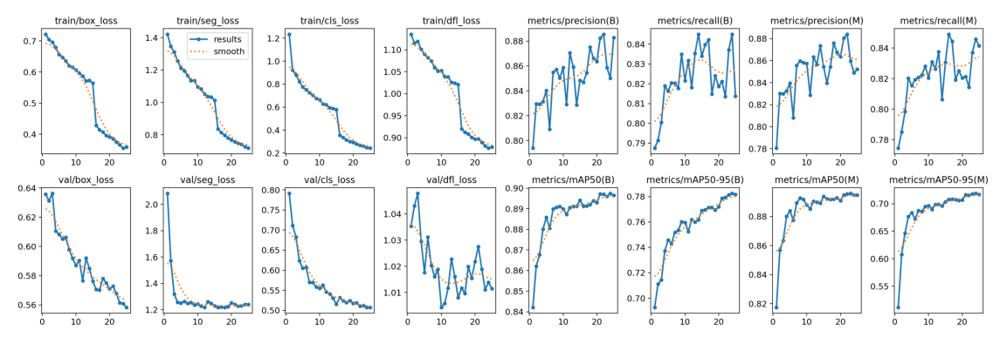

In [ ]:
# Loss and Metrics Graphs
plt.figure(figsize=(12, 8))

img = Image.open(os.path.join(project_name, "results.png"))
plt.imshow(img)
plt.tight_layout()
plt.axis("off");

## **Inference with the Trained Model**

Inference with a fine-tuned Ultralytics YOLO model is straightforward, as it accepts a wide range of image and video formats for predictions. Additionally, the results are presented graphically and can be obtained in real time. All accepted formats are detailed in the official [Ultralytics documentation](https://docs.ultralytics.com/modes/predict/#inference-sources).

In [ ]:
# Load the trained model
model = YOLO(os.path.join(project_name, "weights/best.pt"))

In [ ]:
# Function for image inference
def image_segmentation(images, n_rows=2, n_cols=2, random=True, font_size=15, save=False, path_save=""):
  n_samples = int(n_rows * n_cols)
  if random:
    sample_images = np.random.choice(images, n_samples, replace=False).tolist()
  else:
    sample_images = images[:n_samples]

  results = model.predict(
      source=sample_images,
      imgsz=imgsz,
      save=False,
      verbose=False
  )

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i, result in enumerate(results):
    result = result.plot(line_width=2, font_size=font_size, pil=True)
    result = np.array(result)[..., ::-1] #Convert the image to RGB format
    axes[i].imshow(result)
    axes[i].axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

### **Validation Dataset**

In [ ]:
val_image_paths = glob(os.path.join(dataset_dir, "val/images/*.jpg"))

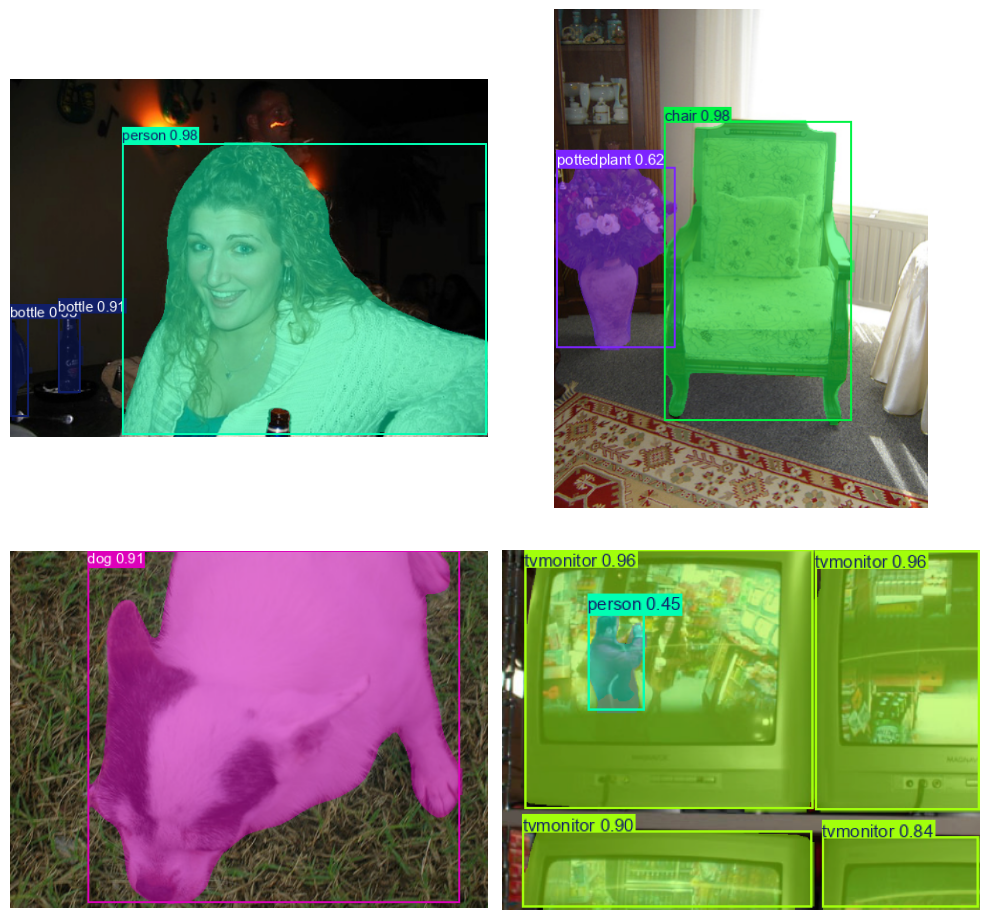

In [ ]:
image_segmentation(val_image_paths)

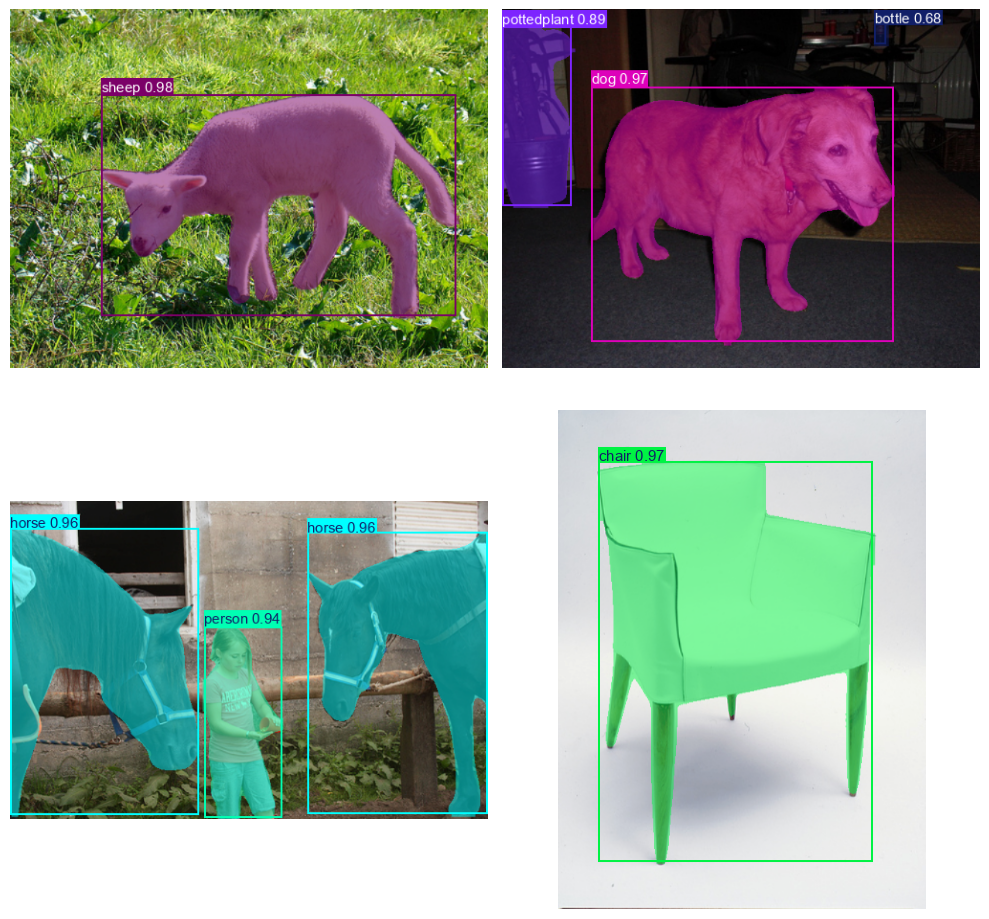

In [ ]:
image_segmentation(val_image_paths)

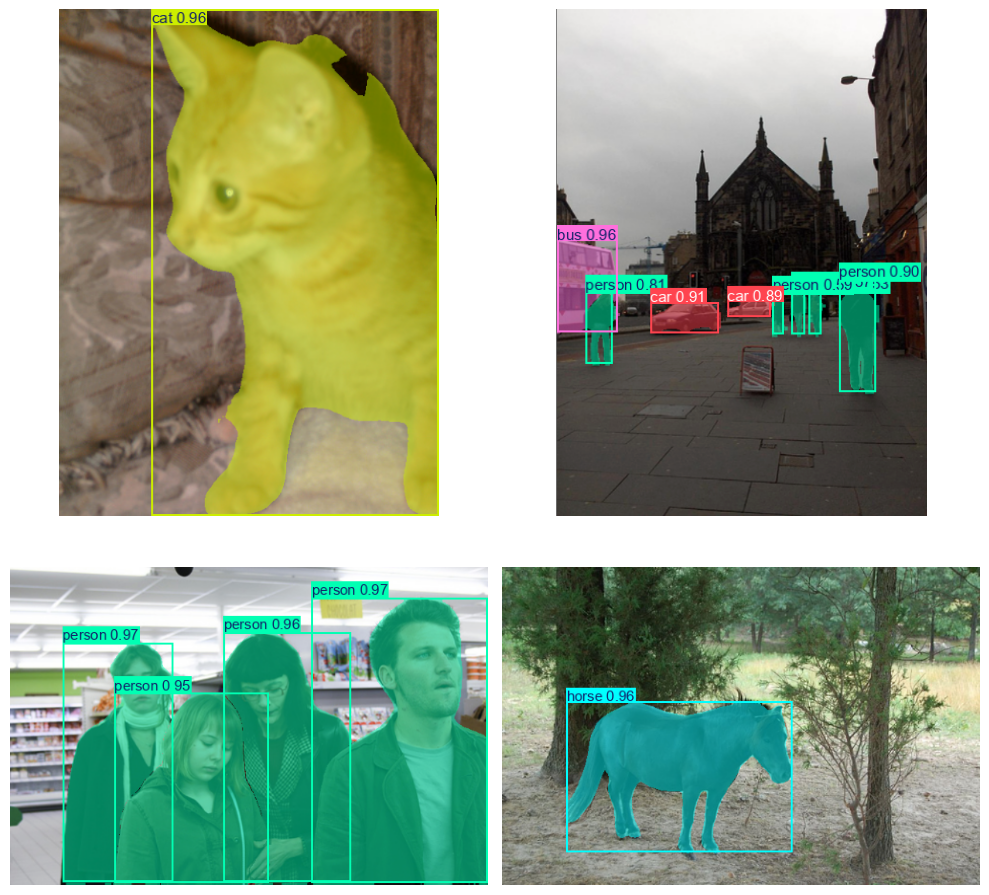

In [ ]:
image_segmentation(val_image_paths)

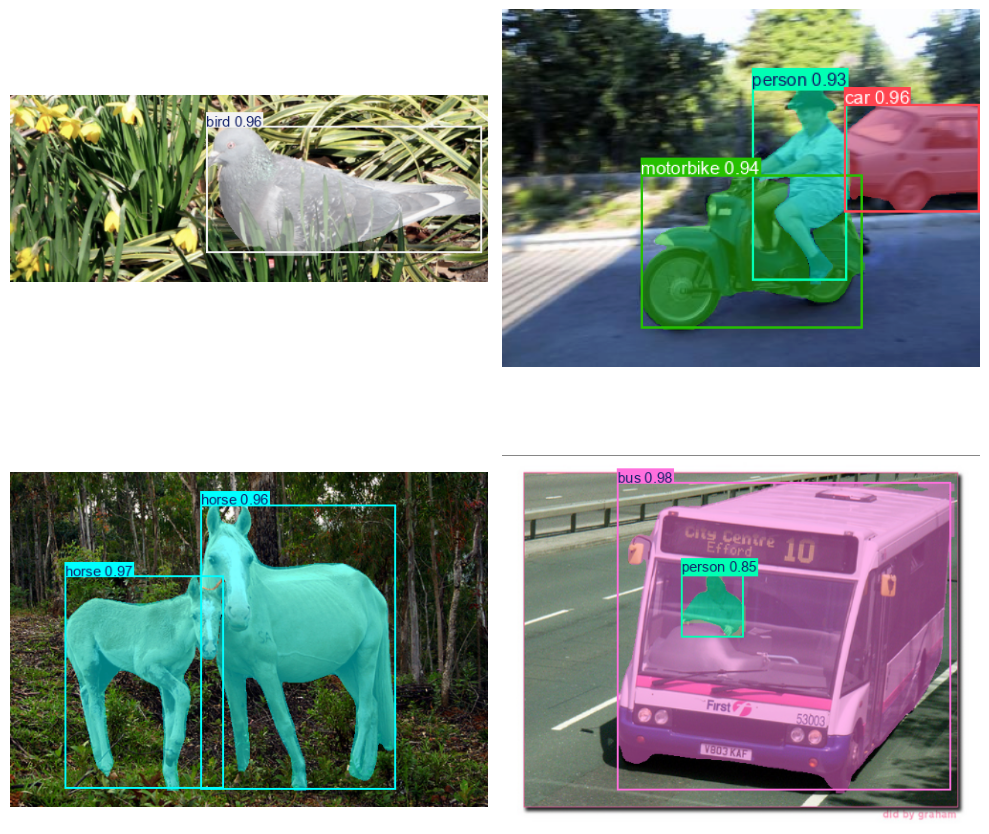

In [ ]:
image_segmentation(val_image_paths, save=True, path_save="InstanceSegmentation_YOLO11l_SBD_1.png")

### **Internet Images**

In [ ]:
list_urls = [
    "https://keras.io/img/guides/object_detection_keras_cv/object_detection_keras_cv_8_0.png",
    "https://static1.squarespace.com/static/53dd6676e4b0fedfbc26ea91/54b6c509e4b062126976d942/5b3a4473352f53eeeed1c9e8/1694015626604/36girlcrossingwidestreet.jpg?format=1500w",
    "https://us.123rf.com/450wm/wavebreakmediamicro/wavebreakmediamicro1603/wavebreakmediamicro160322020/54320748-familia-que-ruega-mientras-est%C3%A1-sentado-en-mesa-de-comedor-en-el-hogar.jpg",
    "https://www.tamilnadutourism.tn.gov.in/img/pages/medium-desktop/take-a-ride-in-the-toy-train-1653978188_8ac904b5bdb228abad78.webp",

    "https://i.dailymail.co.uk/i/pix/2013/09/23/article-2429850-1830107200000578-251_634x397.jpg",
    "https://akm-img-a-in.tosshub.com/businesstoday/images/story/202308/ezgif-sixteen_nine_91.jpg",
    "https://www.ainonline.com/cdn-cgi/image/width=1200,format=webp,quality=95/https://backend.ainonline.com/sites/default/files/styles/fpsc_1200x630/public/uploads/2022/05/374-p180-avanti.1.gif?h=16a6ccf5&itok=oLXodzhW",
    "https://media.istockphoto.com/id/1159538131/photo/four-egrets-on-cow-back.jpg?s=612x612&w=0&k=20&c=y4u1lvHUEsVhqnDf96foTTtvYkS9HsxQG5rCQl8t9Tk=",

    "https://www.shutterstock.com/image-photo/friendly-brown-horse-sheep-260nw-632466644.jpg",
    "https://images.boats.com/resize/1/3/57/2024-yamaha-boats-255-fsh-sport-h-power-9430357-964620355-0-180620240204-0.jpg?t=1718701342000",
    "https://previews.123rf.com/images/andreypopov/andreypopov1509/andreypopov150900596/45461250-hombre-joven-pel%C3%ADcula-de-observaci%C3%B3n-en-la-televisi%C3%B3n-en-la-sala-de-estar.jpg",
    "https://s3.amazonaws.com/arc-wordpress-client-uploads/infobae-wp/wp-content/uploads/2016/06/04204411/auto-moto.jpg"
]

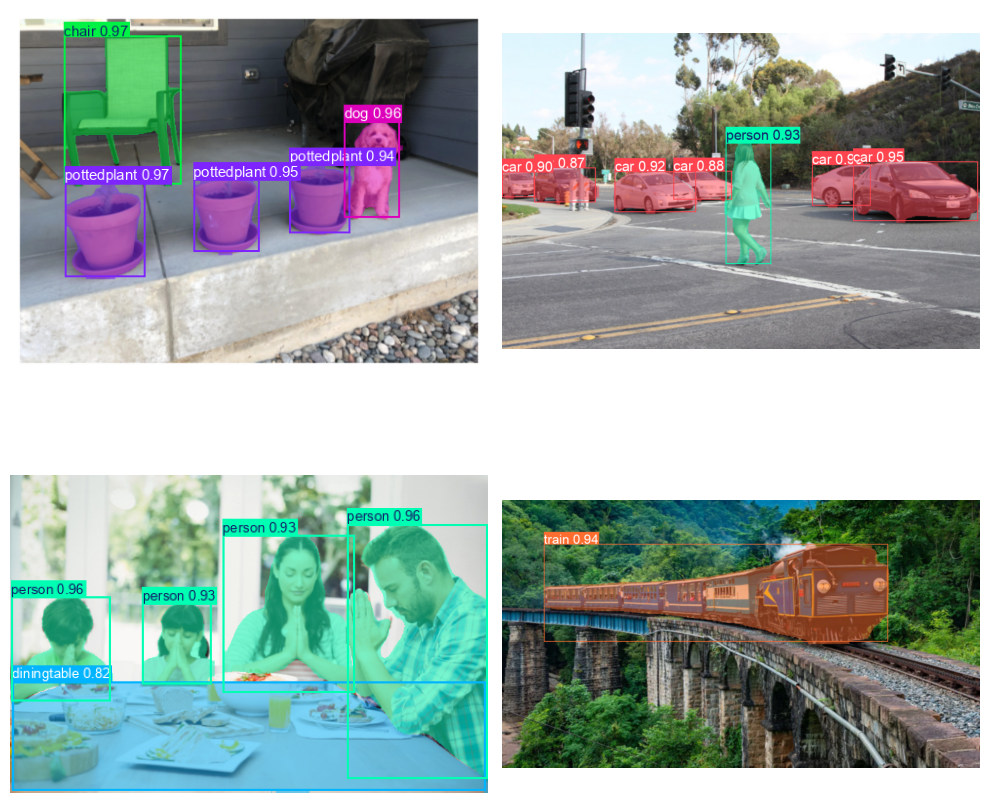

In [ ]:
image_segmentation(
    list_urls[:4], random=False, font_size=None, 
    save=True, path_save="InstanceSegmentation_YOLO11l_SBD_2.png"
)

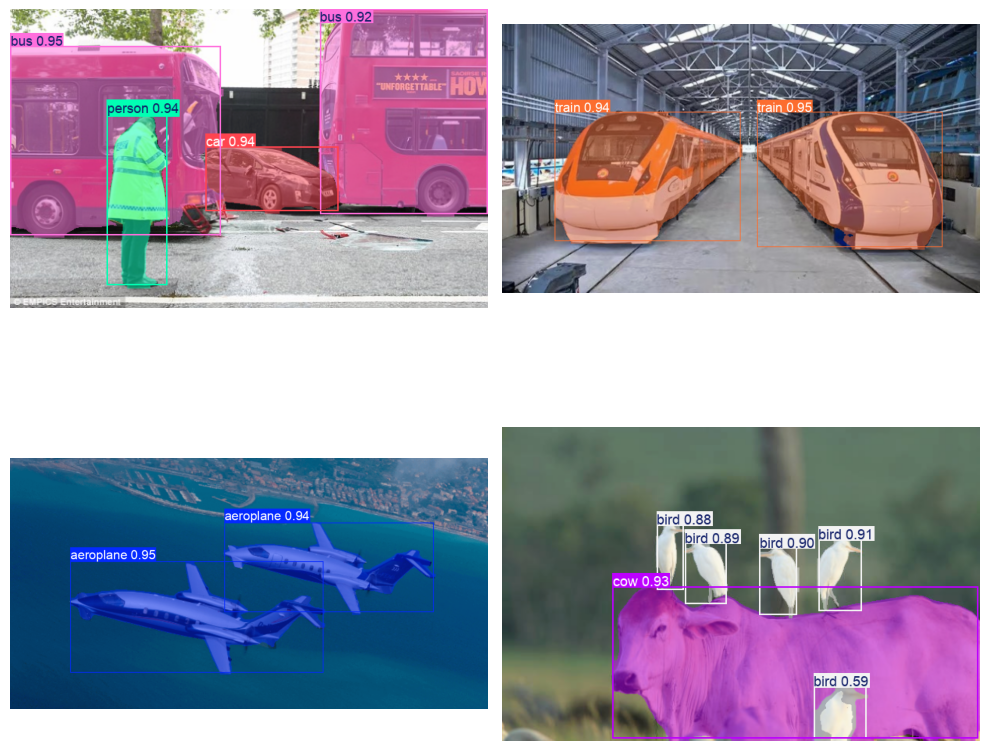

In [ ]:
image_segmentation(list_urls[4:8], random=False, font_size=None)

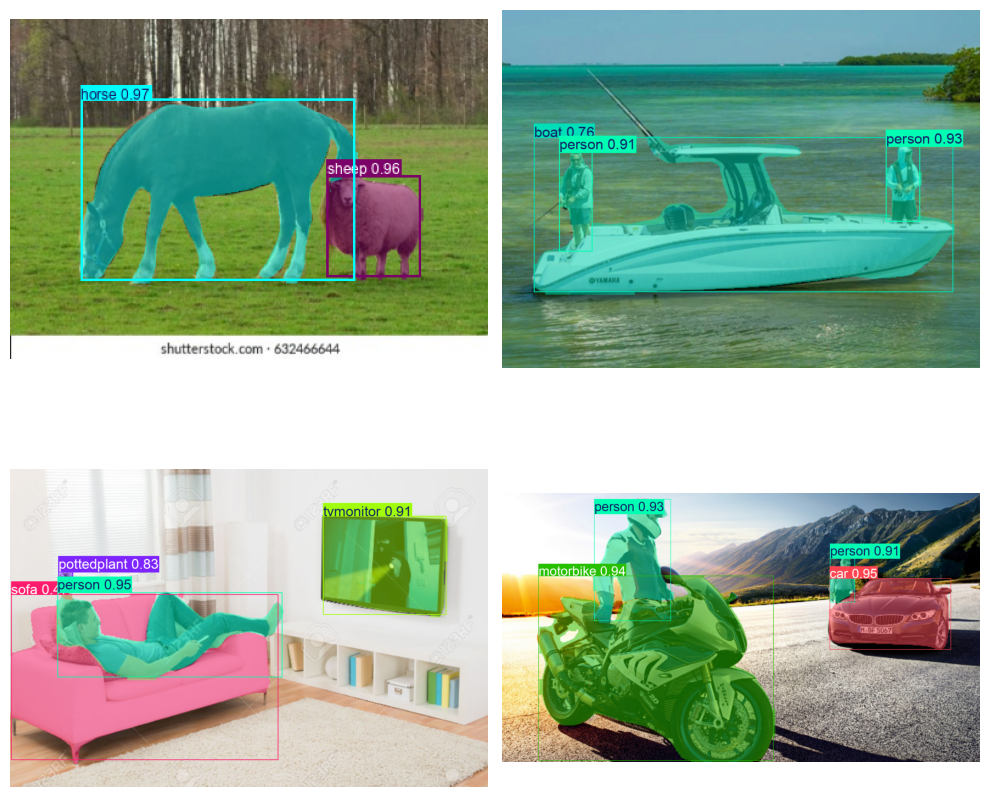

In [ ]:
image_segmentation(list_urls[8:], random=False, font_size=None)

### **Video Inference**

The videos used for inference are downloaded from the [Pixabay](https://pixabay.com/) website.

In [57]:
video_urls = [
    "/content/drive/MyDrive/Videos/sbd.mp4"
]

In [ ]:
# Function for video inference
def video_segmentation(video, video_path):
  results = model.predict(
      source=video,
      imgsz=imgsz,
      line_width=2,
      stream=False,
      stream_buffer=False,
      vid_stride=1,
      save=True,
      save_frames=False,
      verbose=False
  )

  # Convert the resulting video from AVI to MP4 format
  filename = os.path.basename(video).split(".")[0]
  result_path = os.path.join("/content/runs/segment/predict", f"{filename}.avi")
  !ffmpeg -i $result_path $video_path -loglevel quiet -y
   
  # Clean up temporary files generated during inference
  !rm -r /content/runs/
  clear_output(wait=False)
  
  # Extract video properties (width and height) for display
  cap = cv2.VideoCapture(video_path)
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
  cap.release()
  
  # Display the processed video
  display(Video(video_path, embed=True, width=width, height=height))

In [55]:
video_segmentation(video_urls[0], "InstanceSegmentation_YOLO11l_SBD.mp4")

## **Conclusion**

The **YOLO11l-seg** model, fine-tuned with the **Semantic Boundary Dataset (SBD)**, has achieved a $\text{mAP}^{\text{mask}}_{50}$ of **0.895** and a $\text{mAP}^{\text{mask}}_{50-95}$ of **0.719** on the validation set. These results indicate strong performance in instance segmentation. It is worth noting that using SBD significantly improves performance compared to the PASCAL VOC dataset, thanks to the superior quality of its annotations, especially in instance segmentation. However, as observed during SBD preprocessing, there is still room for improvement in annotation quality.  

The metrics and loss chart shows that the training and validation losses are beginning to converge, particularly the `seg_loss` and `dfl_loss` validation losses. Additionally, the mask and bounding box metrics in validation only improve slightly in the last few epochs, suggesting that training beyond 25 epochs would not yield significant improvements and could lead to overfitting. This reinforces the appropriate selection of training hyperparameters.  

Moreover, the bounding box metrics are slightly higher than the mask metrics, which is expected since instance segmentation is a more challenging task than object detection. To achieve better results, it would be advisable to improve SBD annotations and increase the number of images and annotations in the training dataset, as well as to use the **YOLO11x-seg** model. However, this would require greater computational resources than the free Colab GPU, due to the extensive fine-tuning time. Nevertheless, the fine-tuned model already delivers excellent results, as evidenced by the metric evaluation and the inference performed on the validation set, as well as on other images and videos available online.  